In [1]:
import numpy as np 
import pandas as pd
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly import __version__
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.subplots import make_subplots

In [2]:
cr = pd.read_csv("D:\\crime.csv",encoding='latin1')
cr.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [3]:
cr.drop('OFFENSE_CODE', inplace=True, axis=1)
cr.drop('OFFENSE_DESCRIPTION', inplace=True, axis=1)
cr.drop('REPORTING_AREA', inplace=True, axis=1)
cr.drop('OCCURRED_ON_DATE', inplace=True, axis=1)
cr.head()

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,Larceny,D14,NaN,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,Vandalism,C11,NaN,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,Towed,D4,NaN,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,Investigate Property,D4,NaN,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,Investigate Property,B3,NaN,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [4]:
cr["SHOOTING"].fillna("N", inplace = True)

cr['Lat'] = cr['Lat'].fillna(-1)
cr['Long'] = cr['Long'].fillna(-1)

cr['UCR_PART'] = cr['UCR_PART'].fillna("Other")

In [5]:
cr.dropna(subset = ['STREET'], inplace = True)
cr.dropna(subset = ['DISTRICT'], inplace = True)

In [6]:
cr.drop_duplicates(subset="INCIDENT_NUMBER", inplace=True)

In [7]:
cr.isnull().sum()

INCIDENT_NUMBER       0
OFFENSE_CODE_GROUP    0
DISTRICT              0
SHOOTING              0
YEAR                  0
MONTH                 0
DAY_OF_WEEK           0
HOUR                  0
UCR_PART              0
STREET                0
Lat                   0
Long                  0
Location              0
dtype: int64

In [8]:
cr.apply(pd.Series.nunique)

INCIDENT_NUMBER       272592
OFFENSE_CODE_GROUP        67
DISTRICT                  12
SHOOTING                   2
YEAR                       4
MONTH                     12
DAY_OF_WEEK                7
HOUR                      24
UCR_PART                   4
STREET                  4338
Lat                    17763
Long                   17761
Location               17777
dtype: int64

In [9]:
#For sorting weekdays in correct order a key is created
m = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

In [10]:
#The data of total crime values
crimes_per_year = pd.DataFrame(data=cr['YEAR'].value_counts().reset_index().values, columns=["YEAR","CRIME COUNT"]).sort_values('YEAR').reset_index(drop=True)
crimes_per_month = pd.DataFrame(data=cr['MONTH'].value_counts().reset_index().values, columns=["MONTH","CRIME COUNT"]).sort_values('MONTH').reset_index(drop=True)
crimes_per_day = pd.DataFrame(data=cr['DAY_OF_WEEK'].value_counts().reset_index().values, columns=["DAY","CRIME COUNT"])
crimes_per_day["DAY"] = pd.Categorical(crimes_per_day['DAY'], categories=m, ordered=True)
crimes_per_day = crimes_per_day.sort_values('DAY').reset_index(drop=True)
crimes_per_hour = pd.DataFrame(data=cr['HOUR'].value_counts().reset_index().values, columns=["HOUR","CRIME COUNT"]).sort_values('HOUR').reset_index(drop=True)
crimes_per_district = pd.DataFrame(data=cr['DISTRICT'].value_counts().reset_index().values, columns=["DISTRICT","CRIME COUNT"])
crimes_per_street = pd.DataFrame(data=cr['STREET'].value_counts().reset_index().values, columns=["STREET","CRIME COUNT"]).sort_values('CRIME COUNT',ascending=False).reset_index(drop=True).head(50)

In [11]:
#Data for total crime counts for each UCR Parts
ucr_year = pd.DataFrame(data =(cr.groupby(["YEAR","UCR_PART"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["YEAR","UCR_PART","CRIME COUNT"]).sort_values('YEAR').reset_index(drop=True)
ucr_month = pd.DataFrame(data =(cr.groupby(["MONTH","UCR_PART"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["MONTH","UCR_PART","CRIME COUNT"]).sort_values('MONTH').reset_index(drop=True)
ucr_day = pd.DataFrame(data =(cr.groupby(["DAY_OF_WEEK","UCR_PART"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["DAY","UCR_PART","CRIME COUNT"]).sort_values('DAY').reset_index(drop=True)
ucr_day["DAY"] = pd.Categorical(ucr_day['DAY'], categories=m, ordered=True)
ucr_day = ucr_day.sort_values('DAY').reset_index(drop=True)
ucr_hour = pd.DataFrame(data =(cr.groupby(["HOUR","UCR_PART"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["HOUR","UCR_PART","CRIME COUNT"]).sort_values('HOUR').reset_index(drop=True)
ucr_district = pd.DataFrame(data =(cr.groupby(["DISTRICT","UCR_PART"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["DISTRICT","UCR_PART","CRIME COUNT"])
ucr_street = pd.DataFrame(data =(cr.groupby(["STREET","UCR_PART"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["STREET","UCR_PART","CRIME COUNT"]).sort_values('CRIME COUNT',ascending=False).reset_index(drop=True).head(50)

In [12]:
offense_code_count = pd.DataFrame(cr['OFFENSE_CODE_GROUP'].value_counts().reset_index().values, columns=["OFFENSE_CODE_GROUP'","CRIME COUNT"])

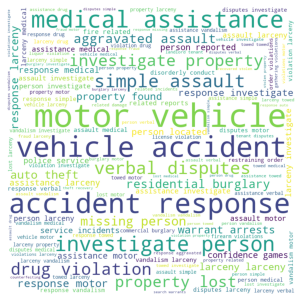

In [13]:
comment_words = ''
stopwords = set(STOPWORDS)

# iterate through the csv file
for val in cr.OFFENSE_CODE_GROUP:
    #Typecasting each value to string
    val = str(val)
    # split the value
    tokens=val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "

wordcloud=WordCloud(width = 800, height = 800, background_color='white', stopwords = stopwords, min_font_size = 10).generate(comment_words)

# plot the WordCloud image                      
plt.figure(figsize = (4,4), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

In [14]:
fig = make_subplots(
    rows=2, cols=3,specs=[[{"type": "scatter"}, {"type": "scatter"},{"type": "scatter"}],[{"type": "scatter"},{"type": "bar"}, {"type": "bar"}]],
    subplot_titles=("Number of crimes per year", "Number of crimes per month", "Number of crimes per day", "Number of crimes per hour","Number of crimes per district","Number of crimes per streets (For highest 50 value)"))
# Add traces
fig.add_trace(go.Scatter(x=crimes_per_year["YEAR"], y=crimes_per_year["CRIME COUNT"]), row=1, col=1)
fig.add_trace(go.Scatter(x=crimes_per_month["MONTH"], y=crimes_per_month["CRIME COUNT"]), row=1, col=2)
fig.add_trace(go.Scatter(x=crimes_per_day["DAY"], y=crimes_per_day["CRIME COUNT"]), row=1, col=3)
fig.add_trace(go.Scatter(x=crimes_per_hour["HOUR"], y=crimes_per_hour["CRIME COUNT"]), row=2, col=1)
fig.add_trace(go.Bar(x=crimes_per_district["DISTRICT"], y=crimes_per_district["CRIME COUNT"]), row=2, col=2)
fig.add_trace(go.Bar(x=crimes_per_street["STREET"], y=crimes_per_street["CRIME COUNT"]), row=2, col=3)
# Update xaxis properties
fig.update_xaxes(title_text="Year", row=1, col=1)
fig.update_xaxes(title_text="Month", range=[0, 13], row=1, col=2)
fig.update_xaxes(title_text="Day", row=1, col=3)
fig.update_xaxes(title_text="Hour",row=2, col=1)
fig.update_xaxes(title_text="District", row=2, col=2)
fig.update_xaxes(title_text="Street", row=2, col=3)
# Update yaxis properties
fig.update_yaxes(title_text="Crime Count", row=1, col=1)
fig.update_yaxes(title_text="Crime Count",row=1, col=2)
fig.update_yaxes(title_text="Crime Count", row=1, col=3)
fig.update_yaxes(title_text="Crime Count", row=2, col=1)
fig.update_yaxes(title_text="Crime Count", row=2, col=2)
fig.update_yaxes(title_text="Crime Count", row=2, col=3)
# Update title
fig.update_layout(showlegend=False,title_text="Distributions of Total Number of Crimes Between 2015-2018", height=900)
fig.show()

In [15]:
fig = make_subplots(
    rows=1, cols=2,specs=[[{"type": "pie"}, {"type": "pie"}]],
    subplot_titles=("Percentage of crimes per year","Percentage of crimes for UCR Parts"))

fig.add_trace(go.Pie(labels=crimes_per_year['YEAR'], values=crimes_per_year['CRIME COUNT'], textinfo='label+percent',pull=[0, 0, 0.1, 0]), row=1, col=1)
fig.add_trace(go.Pie(labels=ucr_year['UCR_PART'], values=crimes_per_year['CRIME COUNT'], textinfo='label+percent',pull=[0, 0, 0.1, 0]), row=1, col=2)

fig.update_layout(showlegend=False,title_text="Distribution percentages of Total Number of Crimes Between 2015-2018", height=500)
fig.show()

In [16]:
df = pd.DataFrame(data =(cr.groupby(["YEAR","UCR_PART",'OFFENSE_CODE_GROUP']).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["YEAR","UCR_PART",'OFFENSE_CODE_GROUP',"CRIME COUNT"])
fig = px.sunburst(df, path=['YEAR', 'UCR_PART', 'OFFENSE_CODE_GROUP'], values='CRIME COUNT')

fig.show()

In [17]:
ucr_offense = pd.DataFrame(data =(cr.groupby(["UCR_PART","OFFENSE_CODE_GROUP"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["UCR_PART","OFFENSE_CODE_GROUP","CRIME COUNT"]).sort_values('UCR_PART').reset_index(drop=True)
ucr_offense['all'] = 'all'
fig = px.treemap(ucr_offense, path=['all', 'UCR_PART', 'OFFENSE_CODE_GROUP'], values='CRIME COUNT',color='CRIME COUNT',color_continuous_scale='RdBu')
fig.show()

In [18]:
df = ucr_offense.sort_values('CRIME COUNT',ascending=False).reset_index(drop=True)
fig = px.bar(df.head(25),x = "OFFENSE_CODE_GROUP", y ="CRIME COUNT",color="UCR_PART",)
fig.update_layout(
    title_text='Top 25 Crimes in Boston', # title of plot
    xaxis_title_text='Offense Code Group', # xaxis label
    yaxis_title_text='Count', # yaxis label
    barmode='stack', xaxis={'categoryorder':'total descending'}
)
fig.show()

In [19]:
df = ucr_offense.sort_values('CRIME COUNT',ascending=False).reset_index(drop=True)
fig = px.bar(df.tail(25),x = "OFFENSE_CODE_GROUP", y ="CRIME COUNT",color="UCR_PART",)
fig.update_layout(
    title_text='Least Committed 25 Crimes in Boston', # title of plot
    xaxis_title_text='Offense Code Group', # xaxis label
    yaxis_title_text='Count', # yaxis label
    barmode='stack', xaxis={'categoryorder':'total ascending'}
)
fig.show()

In [20]:
crime_loc = pd.DataFrame(data =(cr.groupby(['DISTRICT',"Lat","Long","OFFENSE_CODE_GROUP"]).count()[['INCIDENT_NUMBER']]).reset_index().values,columns=['DISTRICT',"Lat","Long","OFFENSE_CODE_GROUP","CRIME COUNT"])
fig = px.scatter(crime_loc[crime_loc['Lat']!=-1], x="Lat", y="Long", animation_frame="OFFENSE_CODE_GROUP", animation_group="CRIME COUNT",
            color="DISTRICT",width=800, height=500)

fig["layout"].pop("updatemenus") 
fig.show()

In [21]:
location = pd.DataFrame(data =(cr.groupby(["Lat","Long"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["Lat","Long","CRIME COUNT"])
x,y = location['Long'], location['Lat']
fig = px.density_mapbox(location,lat="Lat",lon="Long",z="CRIME COUNT",radius=20,center=dict(lat=42.357791, lon=-71),zoom = 10,mapbox_style="stamen-terrain",height=500,width=800)
fig.show()